In [1]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 62.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=8331a60e86ca17b56d5e172eaf9b153376769b9c080fcffba278e9005b8b1b77
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

In [2]:
from google.colab import files
uploaded = files.upload()

Saving SDSS_18_120K.csv to SDSS_18_120K.csv


In [3]:
import pandas as pd
# from scipy.io import arff
import numpy as np
import io

df = pd.read_csv(io.StringIO(uploaded['SDSS_18_120K.csv'].decode('utf-8')))


print(df.dtypes)

objid        float64
ra           float64
dec          float64
u            float64
g            float64
r            float64
i            float64
z            float64
run            int64
rerun          int64
camcol         int64
field          int64
specobjid    float64
class         object
redshift     float64
plate          int64
mjd            int64
fiberid        int64
dtype: object


In [4]:
df.isnull().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

In [5]:
df.size

2160000

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120000 entries, 0 to 119999
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   objid      120000 non-null  float64
 1   ra         120000 non-null  float64
 2   dec        120000 non-null  float64
 3   u          120000 non-null  float64
 4   g          120000 non-null  float64
 5   r          120000 non-null  float64
 6   i          120000 non-null  float64
 7   z          120000 non-null  float64
 8   run        120000 non-null  int64  
 9   rerun      120000 non-null  int64  
 10  camcol     120000 non-null  int64  
 11  field      120000 non-null  int64  
 12  specobjid  120000 non-null  float64
 13  class      120000 non-null  object 
 14  redshift   120000 non-null  float64
 15  plate      120000 non-null  int64  
 16  mjd        120000 non-null  int64  
 17  fiberid    120000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usage: 16.5+ MB


In [7]:
df.describe()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.200000e+05,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.0,120000.000000,120000.000000,1.200000e+05,120000.000000,120000.000000,120000.000000,120000.000000
mean,1.237663e+18,177.162782,24.760234,18.636976,17.405781,16.879918,16.623845,16.466030,3976.896833,301.0,3.309492,186.239408,2.916027e+18,0.169952,2589.868525,53913.184217,342.707142
std,7.883050e+12,78.091616,20.481615,0.831607,0.984321,1.131498,1.206538,1.281903,1693.526624,0.0,1.617244,140.825137,2.496865e+18,0.436013,2217.646838,1549.888972,216.738692
min,1.237650e+18,0.011306,-19.495456,10.611810,9.300097,8.814259,8.667918,8.947795,109.000000,301.0,1.000000,11.000000,2.994900e+17,-0.004268,266.000000,51608.000000,1.000000
25%,1.237660e+18,136.052165,6.621935,18.211953,16.851275,16.195715,15.864358,15.619798,2826.000000,301.0,2.000000,84.000000,1.334220e+18,0.000002,1185.000000,52731.000000,162.000000
50%,1.237660e+18,180.056457,23.503742,18.872550,17.514040,16.889755,16.598590,16.426485,3900.000000,301.0,3.000000,152.000000,2.347515e+18,0.045771,2085.000000,53726.000000,329.000000
75%,1.237670e+18,224.210010,40.059257,19.271068,18.053463,17.582660,17.342098,17.230750,5061.000000,301.0,5.000000,248.000000,3.275320e+18,0.095350,2909.000000,54585.000000,503.000000
max,1.237680e+18,359.999615,84.490494,19.599990,19.996050,31.990100,32.141470,30.017040,8162.000000,301.0,6.000000,982.000000,1.412690e+19,7.011245,12547.000000,58932.000000,1000.000000


In [8]:
df.sample(15)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
6248,1.237670e+18,212.065866,14.704973,19.34194,18.43418,17.94115,17.56527,17.42310,5322,301,1,19,3.090680e+18,GALAXY,0.077343,2745,54231,299
21715,1.237670e+18,4.809988,7.648735,17.95526,16.97229,16.65408,16.53627,16.49466,5598,301,4,147,1.273630e+19,STAR,-0.000888,11312,58433,456
103423,1.237680e+18,10.362340,17.516937,16.68939,15.70233,15.37360,15.25341,15.19828,7845,301,4,15,6.978530e+18,STAR,-0.000393,6198,56211,754
113592,1.237660e+18,231.481428,4.688054,19.54966,17.68602,16.79072,16.33101,15.99540,3910,301,2,142,2.066100e+18,GALAXY,0.083736,1835,54563,250
32362,1.237650e+18,187.745733,0.263106,17.56767,16.55537,16.18516,15.93228,15.79129,756,301,4,480,3.266060e+17,GALAXY,0.043314,290,51941,345
54681,1.237670e+18,237.578790,15.863280,17.03549,15.87850,15.80880,15.79361,15.82294,5323,301,4,62,2.835160e+18,STAR,-0.000432,2518,54243,512
17220,1.237660e+18,141.466854,8.483563,18.14763,16.68912,16.12533,15.91180,15.81734,3478,301,6,168,2.682020e+18,STAR,-0.000015,2382,54169,447
12557,1.237670e+18,122.005629,9.075784,19.48315,17.99129,17.15352,16.73839,16.50849,5935,301,3,35,2.723570e+18,GALAXY,0.143186,2419,54139,72
88057,1.237670e+18,334.345594,39.748765,16.53004,15.34959,15.01840,14.90444,14.88593,6182,301,2,210,2.949970e+18,STAR,-0.000167,2620,54397,399
116870,1.237660e+18,197.590068,39.849587,18.87685,17.47591,16.95201,16.75938,16.64904,3900,301,5,439,3.265240e+18,STAR,0.000014,2900,54569,476


<ipython-input-9-ac8d73a6fcd5>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),cbar=True,annot=True, cmap='Blues')


<Axes: >

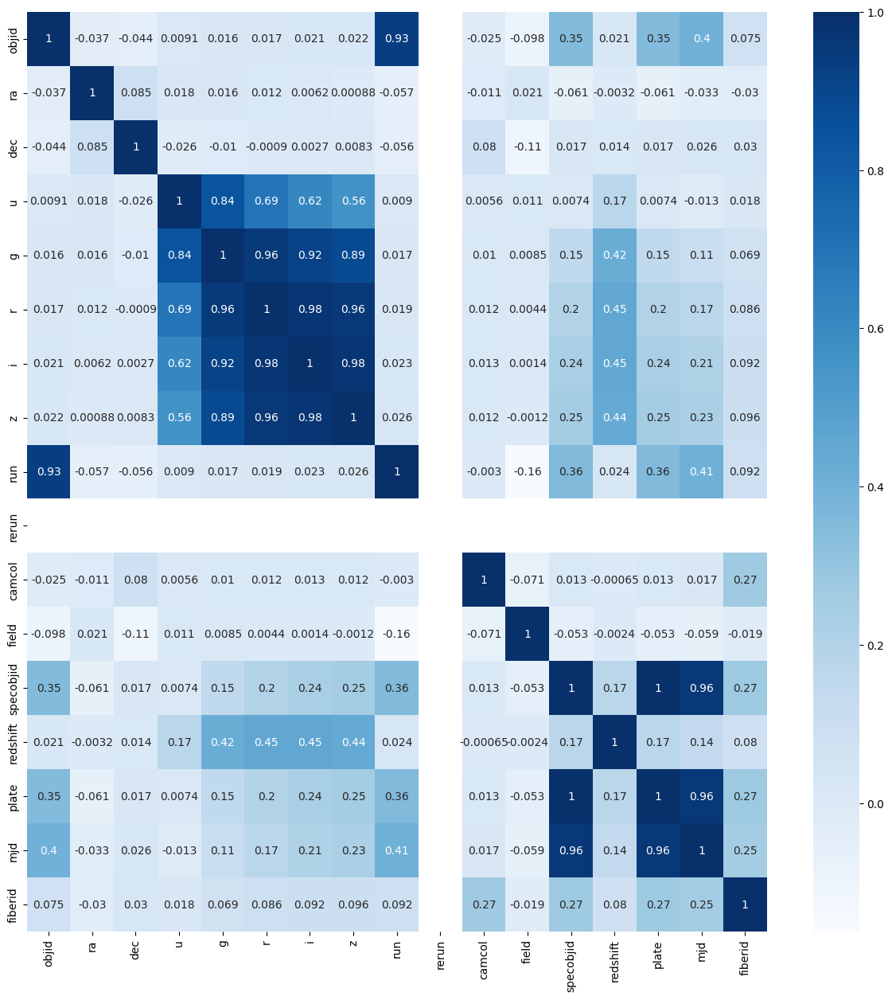

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),cbar=True,annot=True, cmap='Blues')

In [10]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)

<ipython-input-10-ce1e41813c97>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [11]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df['class'].value_counts()

GALAXY    61466
STAR      45878
QSO       12656
Name: class, dtype: int64

array([[<Axes: title={'center': 'objid'}>,
        <Axes: title={'center': 'ra'}>, <Axes: title={'center': 'dec'}>,
        <Axes: title={'center': 'u'}>],
       [<Axes: title={'center': 'g'}>, <Axes: title={'center': 'r'}>,
        <Axes: title={'center': 'i'}>, <Axes: title={'center': 'z'}>],
       [<Axes: title={'center': 'run'}>,
        <Axes: title={'center': 'rerun'}>,
        <Axes: title={'center': 'camcol'}>,
        <Axes: title={'center': 'field'}>],
       [<Axes: title={'center': 'specobjid'}>,
        <Axes: title={'center': 'redshift'}>,
        <Axes: title={'center': 'plate'}>,
        <Axes: title={'center': 'mjd'}>],
       [<Axes: title={'center': 'fiberid'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

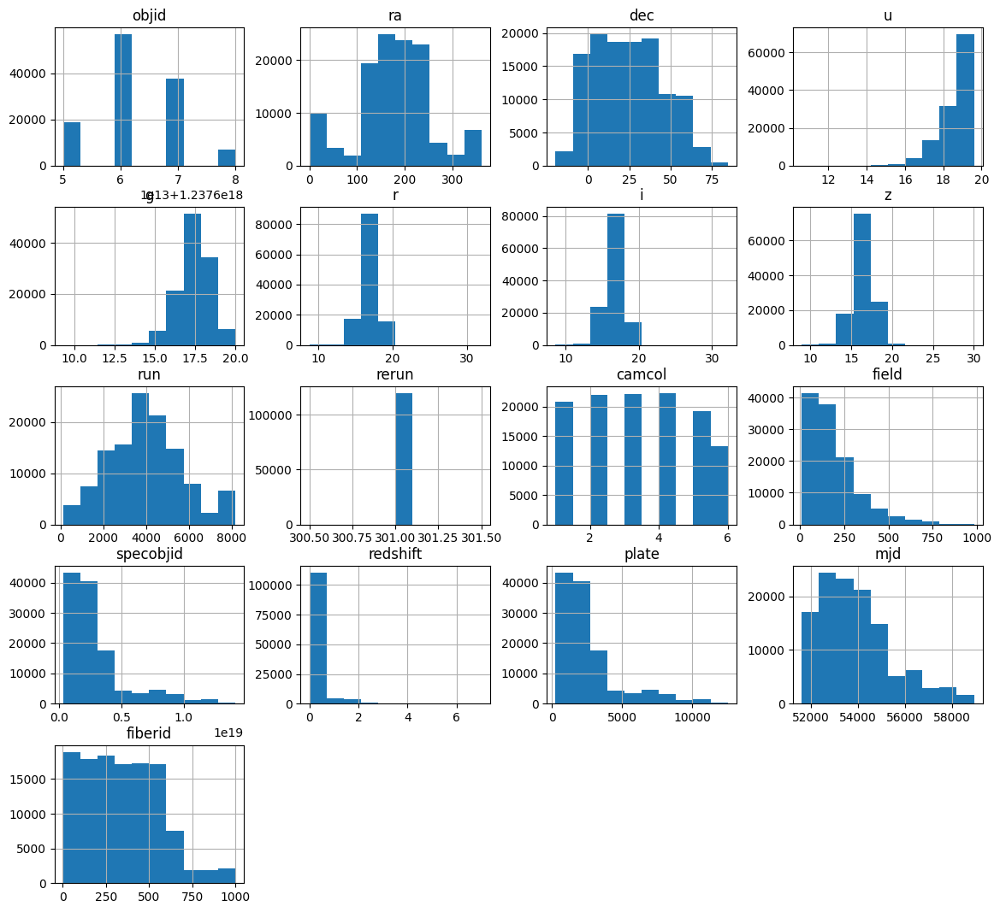

In [20]:
df.hist(figsize=[14,13])

In [22]:
df.skew()

<ipython-input-22-9e0b1e29546f>:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.skew()


objid        0.171117
ra          -0.147397
dec          0.277144
u           -1.394562
g           -0.730261
r           -0.139809
i            0.048728
z            0.159915
run          0.285860
rerun        0.000000
camcol       0.104264
field        1.500489
specobjid    1.845186
redshift     4.029148
plate        1.845186
mjd          0.934754
fiberid      0.467490
dtype: float64